Buston House Price Prediction 

# import liberaries & read data 

In [153]:
import pandas as pd
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn import metrics
%matplotlib inline 

In [154]:
data=pd.read_csv("/content/boston.csv")

# EDA (Explatory Data Analysis) & PreProcessing

In [155]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


In [156]:
data.shape

(506, 14)

In [157]:
data.dtypes

CRIM       float64
ZN         float64
INDUS      float64
CHAS         int64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD          int64
TAX        float64
PTRATIO    float64
B          float64
LSTAT      float64
MEDV       float64
dtype: object

In [158]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    int64  
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [159]:
data.nunique()

CRIM       504
ZN          26
INDUS       76
CHAS         2
NOX         81
RM         446
AGE        356
DIS        412
RAD          9
TAX         66
PTRATIO     46
B          357
LSTAT      455
MEDV       229
dtype: int64

In [160]:
data["CHAS"].value_counts()

0    471
1     35
Name: CHAS, dtype: int64

In [161]:
data.isnull().sum()

CRIM       0
ZN         0
INDUS      0
CHAS       0
NOX        0
RM         0
AGE        0
DIS        0
RAD        0
TAX        0
PTRATIO    0
B          0
LSTAT      0
MEDV       0
dtype: int64

<Axes: >

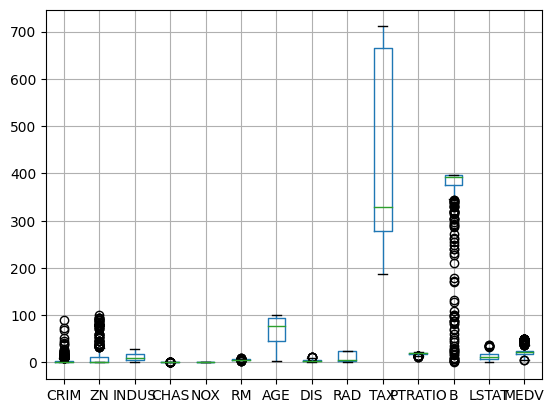

In [162]:
data.boxplot()

<Axes: >

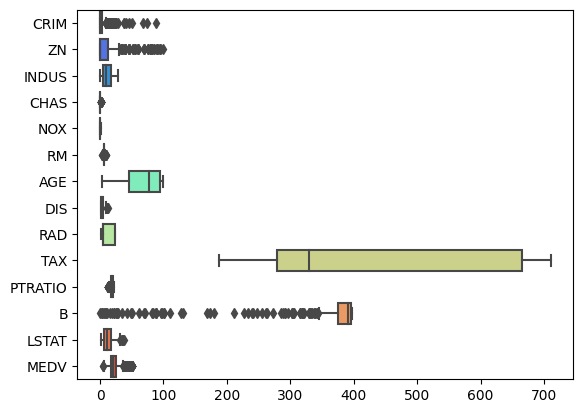

In [163]:
sns.boxplot(data=data,palette='rainbow',orient='h')
#box plot to all features to show outliers

those not outlier those are variety in the data 

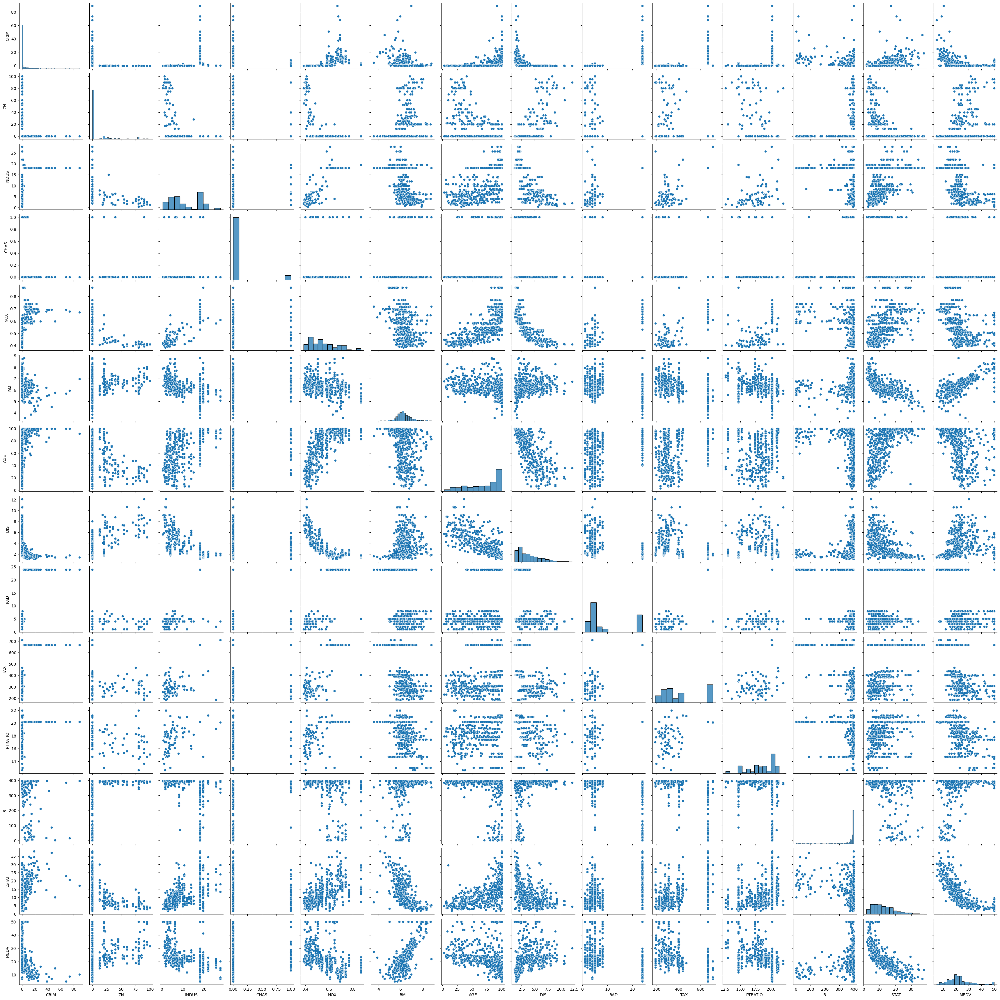

In [164]:
sns.pairplot(data)

In [165]:
data['RAD'].unique()

array([ 1,  2,  3,  5,  4,  8,  6,  7, 24])

In [166]:
data['CHAS'].unique()

array([0, 1])

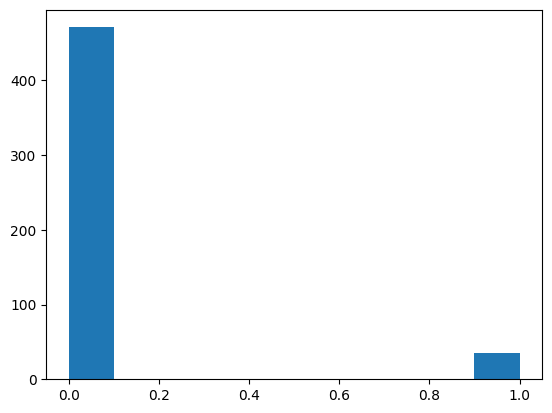

In [167]:
plt.hist(data['CHAS'])
plt.show()

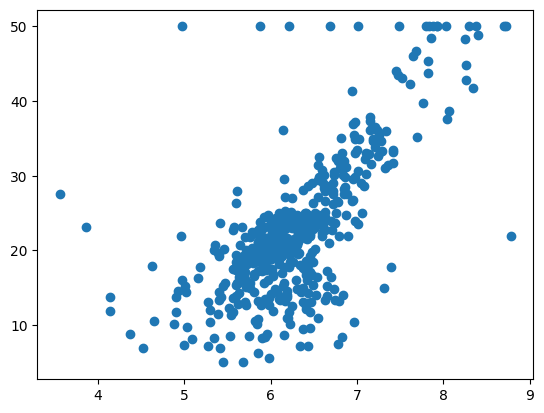

In [168]:
plt.scatter(data['RM'], data['MEDV'])
plt.show()

In [169]:
data.describe()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [170]:
!pip install pandas-profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [171]:
!pip install markupsafe==2.0.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [172]:
from pandas_profiling import ProfileReport

In [173]:
profile=ProfileReport(data)
profile


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [174]:
#calculating z score to know how far from mean value (by calculating standard deviation)
#help you to know more about data
from scipy import stats
z_score=np.abs(stats.zscore(data))
print (z_score)

         CRIM        ZN     INDUS      CHAS       NOX        RM       AGE  \
0    0.419782  0.284830  1.287909  0.272599  0.144217  0.413672  0.120013   
1    0.417339  0.487722  0.593381  0.272599  0.740262  0.194274  0.367166   
2    0.417342  0.487722  0.593381  0.272599  0.740262  1.282714  0.265812   
3    0.416750  0.487722  1.306878  0.272599  0.835284  1.016303  0.809889   
4    0.412482  0.487722  1.306878  0.272599  0.835284  1.228577  0.511180   
..        ...       ...       ...       ...       ...       ...       ...   
501  0.413229  0.487722  0.115738  0.272599  0.158124  0.439316  0.018673   
502  0.415249  0.487722  0.115738  0.272599  0.158124  0.234548  0.288933   
503  0.413447  0.487722  0.115738  0.272599  0.158124  0.984960  0.797449   
504  0.407764  0.487722  0.115738  0.272599  0.158124  0.725672  0.736996   
505  0.415000  0.487722  0.115738  0.272599  0.158124  0.362767  0.434732   

          DIS       RAD       TAX   PTRATIO         B     LSTAT      MEDV  

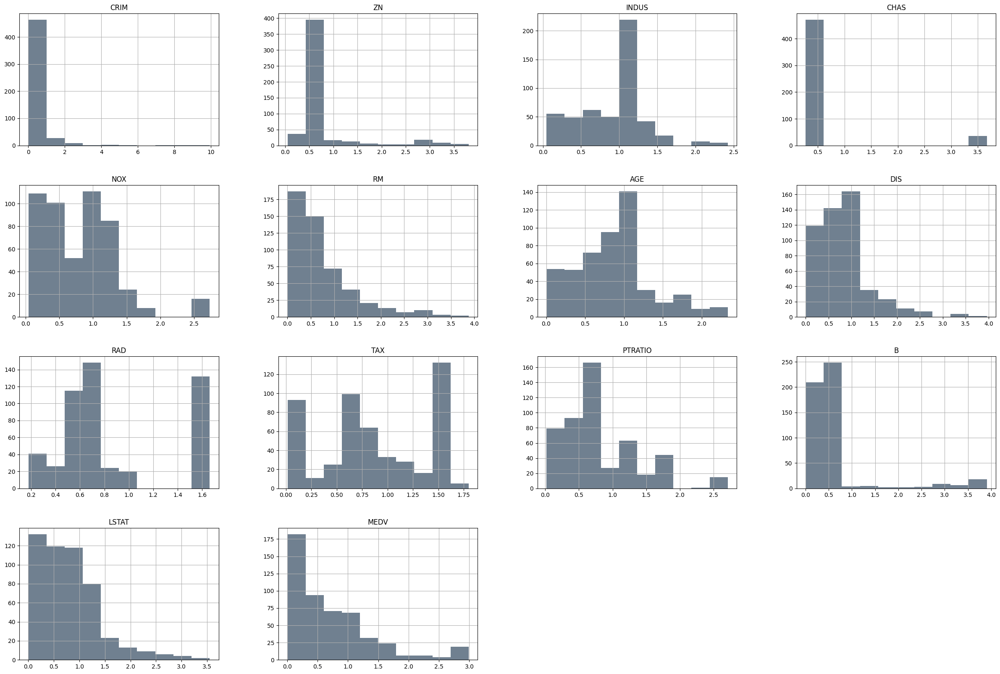

In [175]:
z_score.hist(color='slategray',figsize=(30,20))
plt.title("Standard Normal Distribution", y=1.015, fontsize=22)
plt.xlabel("z-score", labelpad=14)
plt.ylabel("frequency", labelpad=14);


In [176]:
data.corr()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


<Axes: >

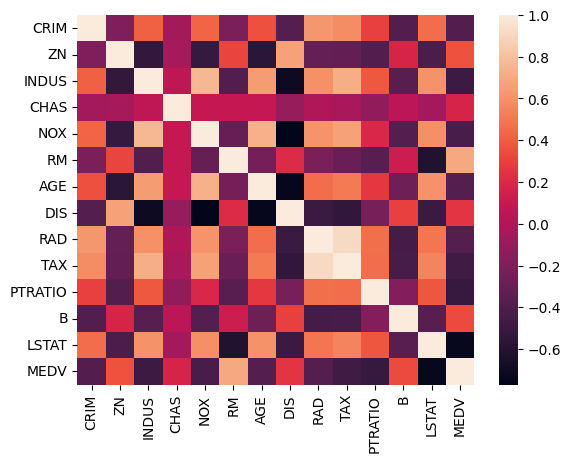

In [177]:
sns.heatmap(data.corr(),)

<Axes: >

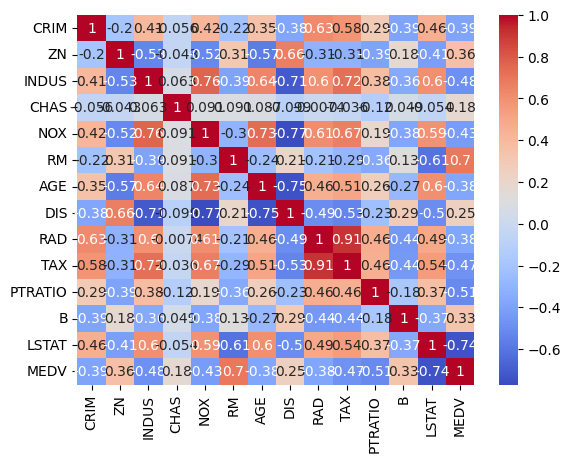

In [178]:
sns.heatmap(data.corr(),cmap='coolwarm',annot=True)
#show the correlation between data using heat map

In [179]:
data.columns

Index(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT', 'MEDV'],
      dtype='object')

# Feature Engineering & Selection 

In [180]:
data.drop(['CHAS','DIS'], axis=1,inplace =True)
# drop features with weak correlation (less than 0.3)

In [181]:
x=data.drop(['MEDV'],axis=1)
y=data['MEDV']

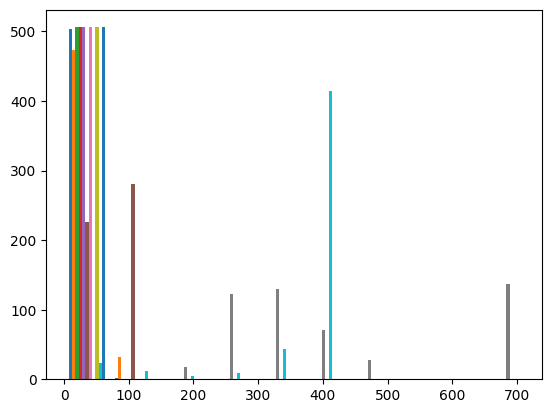

In [182]:
plt.hist(x)
plt.show()


In [183]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
x = scaler.fit_transform(x)


In [184]:
x

array([[-0.41978194,  0.28482986, -1.2879095 , ..., -1.45900038,
         0.44105193, -1.0755623 ],
       [-0.41733926, -0.48772236, -0.59338101, ..., -0.30309415,
         0.44105193, -0.49243937],
       [-0.41734159, -0.48772236, -0.59338101, ..., -0.30309415,
         0.39642699, -1.2087274 ],
       ...,
       [-0.41344658, -0.48772236,  0.11573841, ...,  1.17646583,
         0.44105193, -0.98304761],
       [-0.40776407, -0.48772236,  0.11573841, ...,  1.17646583,
         0.4032249 , -0.86530163],
       [-0.41500016, -0.48772236,  0.11573841, ...,  1.17646583,
         0.44105193, -0.66905833]])

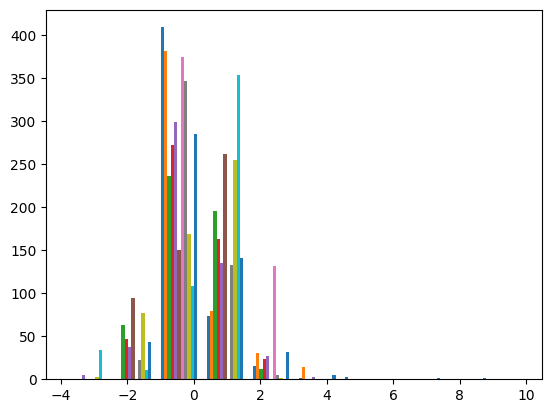

In [185]:
plt.hist(x)
plt.show()


In [186]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=44,test_size=0.2)

# Modeling with 6 Regression models 

# Linear Regression 

In [187]:
from sklearn.linear_model import LinearRegression
reg_model=LinearRegression()
reg_model.fit(x_train,y_train)
reg_model.score(x_test,y_test)

0.784155855586777

# KNN Regressor

In [188]:
from sklearn.neighbors import KNeighborsRegressor
knn = KNeighborsRegressor(n_neighbors=3)
knn.fit(x_train, y_train)
knn.score(x_test, y_test)

0.8766246249794626

# SVR

In [189]:
from sklearn.metrics.pairwise import polynomial_kernel
from sklearn.svm import SVR
svr = SVR(kernel=polynomial_kernel)
svr.fit(x_train,y_train)
svr.score(x_test,y_test)

0.8744444757649065

# Decision Tree Regressor 

In [190]:
from sklearn.tree import DecisionTreeRegressor 
from sklearn.metrics import accuracy_score
regressor = DecisionTreeRegressor(random_state = 44,max_leaf_nodes=20) 
regressor.fit(x_train, y_train)
regressor.score(x_test,y_test)

0.8141615244735259

# Random Forest

In [191]:
from sklearn.ensemble import RandomForestRegressor
regressor = RandomForestRegressor(n_estimators =10, random_state = 44)
regressor.fit(x_train, y_train) 
regressor.score(x_test,y_test)

0.8715014559159007

# XG Boost

In [192]:
import xgboost as xgb
xg_reg = xgb.XGBRegressor( learning_rate = 0.1,max_depth = 5) 
xg_reg.fit(x_train,y_train) 
xg_reg.score(x_test,y_test)

0.9048139892687473

the best model is XG Boost so it was selected for deployment 

# Deployment 

In [193]:
import pickle
pickle.dump(xg_reg,open("xgmodel.pkl", 'wb'))

In [194]:
import joblib 
joblib.dump(xg_reg,"xgmodel.joblib")

['xgmodel.joblib']

# User Part For Prediction 

In [195]:
data.columns 

Index(['CRIM', 'ZN', 'INDUS', 'NOX', 'RM', 'AGE', 'RAD', 'TAX', 'PTRATIO', 'B',
       'LSTAT', 'MEDV'],
      dtype='object')

In [198]:
print("Hello user in my system to predict the price of houses, \n please enter the needed features of the house for prediction")
crim=input("CRIM value  ")
zn=input("ZN value  ")
indus=input('INDUS value  ')
nox=input('nitric oxides concentration value  ')
rm=input('average number of rooms per dwelling value  ')
age=input('Age value  ')
rad=input(' index of accessibility to radial highways value ')
tax=input('tax value  ')
ptratio=input('pupil-teacher ratio by town value  ')
b=input('the proportion of blacks by town value ')
lstat=input('% lower status of the population value ')
features_list=[crim,zn,indus,nox,rm,age,rad,tax,ptratio,b,lstat]
features_array=np.array(features_list, dtype=object)
predict=xg_reg.predict([features_array])
print("\n\n the prediction is that your house's price in $1000's [k$] 3is "+str(predict))

Hello user in my system to predict the price of houses, 
 please enter the needed features of the house for prediction
CRIM value  0.00632
ZN value  18
INDUS value  2.31
nitric oxides concentration value  0.538
average number of rooms per dwelling value  6.575
Age value  65.2
 index of accessibility to radial highways value 1
tax value  296
pupil-teacher ratio by town value  15.3
the proportion of blacks by town value 396.9
% lower status of the population value 4.98


 the prediction is that your house's price in $1000's [k$] 3is [21.344599]
